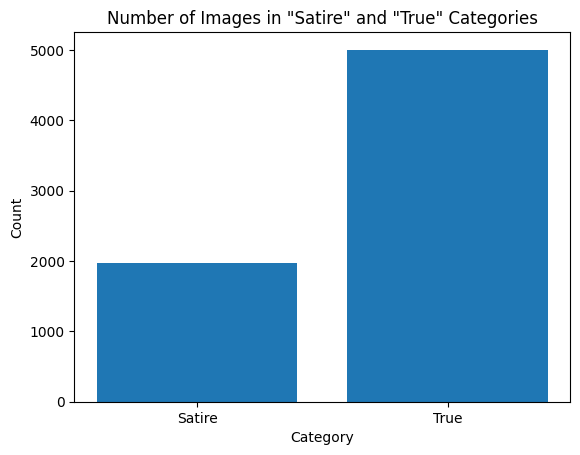

Number of 'satire' images: 1978
Number of 'true' images: 5002


In [2]:
import boto3
import matplotlib.pyplot as plt

# Initialize the S3 client
s3 = boto3.client('s3')

# Specify your S3 bucket name and subfolders
s3_bucket = "satire-spotter-data"
satire_subfolder = "images/satire/"
true_subfolder = "images/true/"

# Function to count objects in a subfolder using pagination
def count_objects_in_subfolder(bucket, prefix):
    try:
        count = 0
        paginator = s3.get_paginator('list_objects_v2')
        for page in paginator.paginate(Bucket=bucket, Prefix=prefix):
            if 'Contents' in page:
                count += len(page['Contents'])
        return count
    except Exception as e:
        print(f"Error counting objects in {prefix}: {str(e)}")
        return 0

# Count images in the "satire" subfolder
satire_count = count_objects_in_subfolder(s3_bucket, satire_subfolder)

# Count images in the "true" subfolder
true_count = count_objects_in_subfolder(s3_bucket, true_subfolder)

# Create a bar chart to compare the counts
categories = ['Satire', 'True']
counts = [satire_count, true_count]

plt.bar(categories, counts)
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Number of Images in "Satire" and "True" Categories')
plt.show()

print(f"Number of 'satire' images: {satire_count}")
print(f"Number of 'true' images: {true_count}")


In [3]:
!pip install Pillow --quiet


[notice] A new release of pip available: 22.3.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip


In [4]:
from PIL import Image
import io
import os
from io import BytesIO

s3_prefix = "images/satire/"
# Specify the destination S3 prefix for converted images
destination_prefix = "images/satire_jpg/"

# List objects in the source S3 prefix
response = s3.list_objects_v2(Bucket=s3_bucket, Prefix=s3_prefix)

def convert_to_jpg(s3_prefix, destination_prefix, response):
    # Iterate through the objects in the source prefix
    for obj in response.get('Contents', []):
        # Get the object key
        object_key = obj['Key']

        # Read the image from S3
        response = s3.get_object(Bucket=s3_bucket, Key=object_key)
        image_bytes = response['Body'].read()

        try:
            # Open the image using Pillow
            img = Image.open(BytesIO(image_bytes))

            # Check the image format and convert it to JPEG if needed
            if img.format not in ["JPEG", "JPG"]:
                img = img.convert("RGB")

                # Remove the file extension and append ".jpg"
                base_filename = os.path.splitext(os.path.basename(object_key))[0]
                new_object_key = f"{destination_prefix}{base_filename}.jpg"

                # Save the converted image to a BytesIO object
                converted_image_bytes = BytesIO()
                img.save(converted_image_bytes, format="JPEG")

                # Upload the converted image to S3
                s3.upload_fileobj(converted_image_bytes, s3_bucket, new_object_key)

                print(f"Converted: {object_key} to {new_object_key}")
            else:
                print(f"Skipped: {object_key} (Already JPEG)")

        except Exception as e:
            print(f"Error processing {object_key}: {str(e)}")

In [5]:
# List objects in the source S3 prefix
true_prefix = "images/true/"
response = s3.list_objects_v2(Bucket=s3_bucket, Prefix=true_prefix)
convert_to_jpg(true_prefix, 'images/true_jpg/', response)

Skipped: images/true/image_4419.jpg (Already JPEG)
Skipped: images/true/image_4449.jpg (Already JPEG)
Skipped: images/true/image_4555.jpg (Already JPEG)
Skipped: images/true/image_5000.jpg (Already JPEG)
Skipped: images/true/image_5001.jpg (Already JPEG)
Skipped: images/true/image_5002.jpg (Already JPEG)
Skipped: images/true/image_5003.jpg (Already JPEG)
Skipped: images/true/image_5004.jpg (Already JPEG)
Skipped: images/true/image_5005.jpg (Already JPEG)
Skipped: images/true/image_5006.jpg (Already JPEG)
Skipped: images/true/image_5007.jpg (Already JPEG)
Skipped: images/true/image_5008.jpg (Already JPEG)
Skipped: images/true/image_5009.jpg (Already JPEG)
Skipped: images/true/image_5010.jpg (Already JPEG)
Skipped: images/true/image_5011.jpg (Already JPEG)
Skipped: images/true/image_5012.jpg (Already JPEG)
Skipped: images/true/image_5013.jpg (Already JPEG)
Skipped: images/true/image_5014.jpg (Already JPEG)
Skipped: images/true/image_5015.jpg (Already JPEG)
Skipped: images/true/image_5016

In [6]:
# Define the folders
satire_folder = 'images/satire/'
true_folder = 'images/true/'

# List objects in the satire folder
satire_objects = s3.list_objects_v2(Bucket=s3_bucket, Prefix=satire_folder)

# List objects in the true folder
true_objects = s3.list_objects_v2(Bucket=s3_bucket, Prefix=true_folder)

# Function to delete non-JPG files
def delete_non_jpg_objects(objects):
    for obj in objects.get('Contents', []):
        key = obj['Key']
        if not key.endswith('.jpg'):
            print(f"Deleting: s3://{s3_bucket}/{key}")
            s3.delete_object(Bucket=s3_bucket, Key=key)

# Delete non-JPG files in the satire folder
delete_non_jpg_objects(satire_objects)

# Delete non-JPG files in the true folder
delete_non_jpg_objects(true_objects)

print("Non-JPG files deleted.")

Non-JPG files deleted.


In [7]:
import boto3
# Initialize S3 client
s3 = boto3.client('s3')

# Define the S3 bucket and folders
s3_bucket = "satire-spotter-data"
s3_satire_folder = "images/satire"
s3_true_folder = "images/true"

Sample Satire Images:


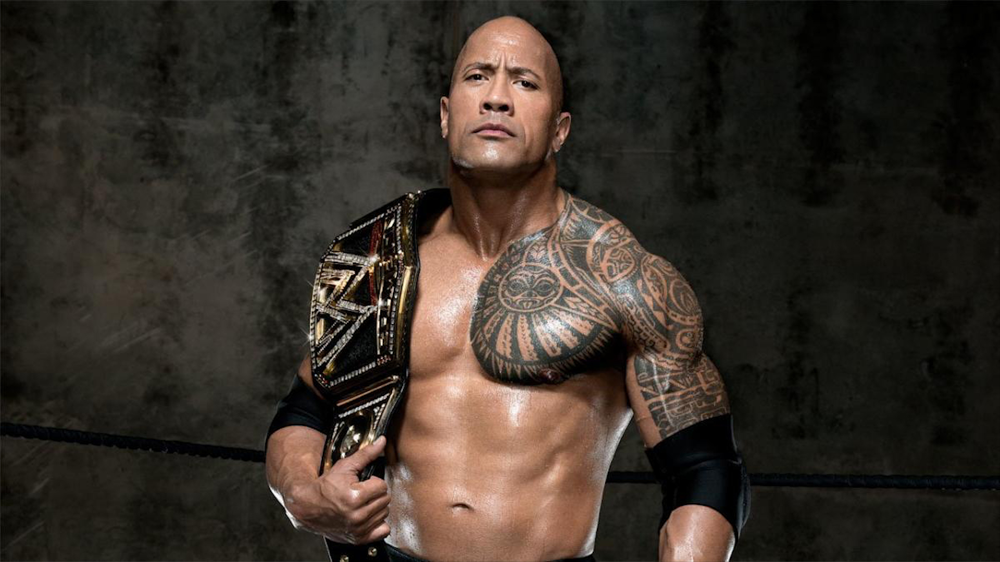

Downloaded and saved: images/satire/image_1920.jpg -> image_1920.jpg


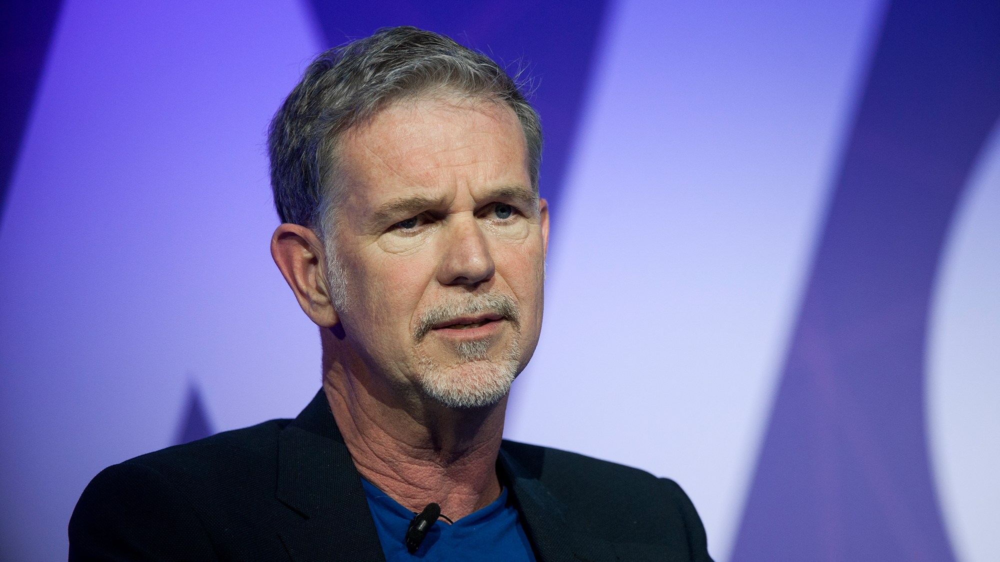

Downloaded and saved: images/satire/image_1362.jpg -> image_1362.jpg


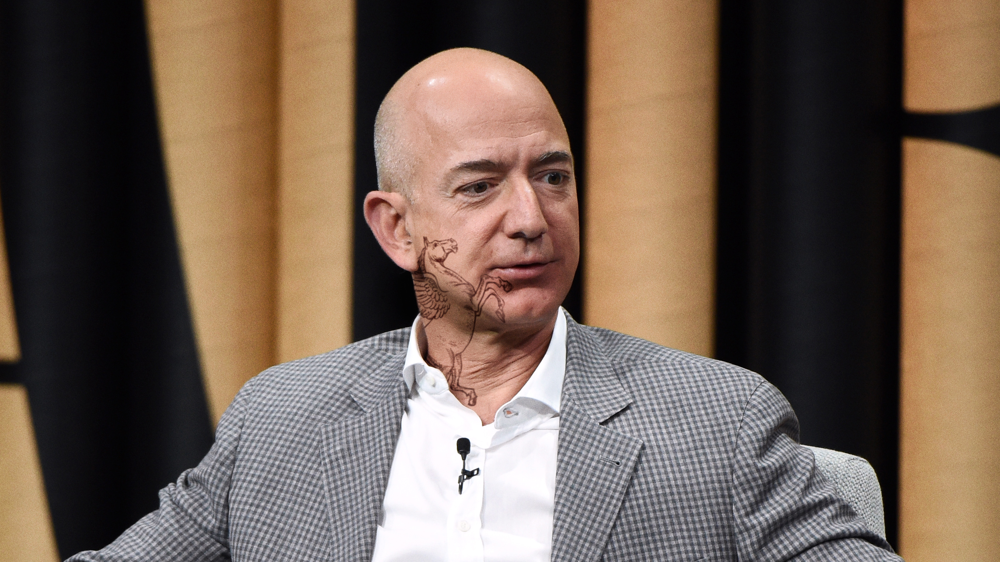

Downloaded and saved: images/satire/image_1765.jpg -> image_1765.jpg


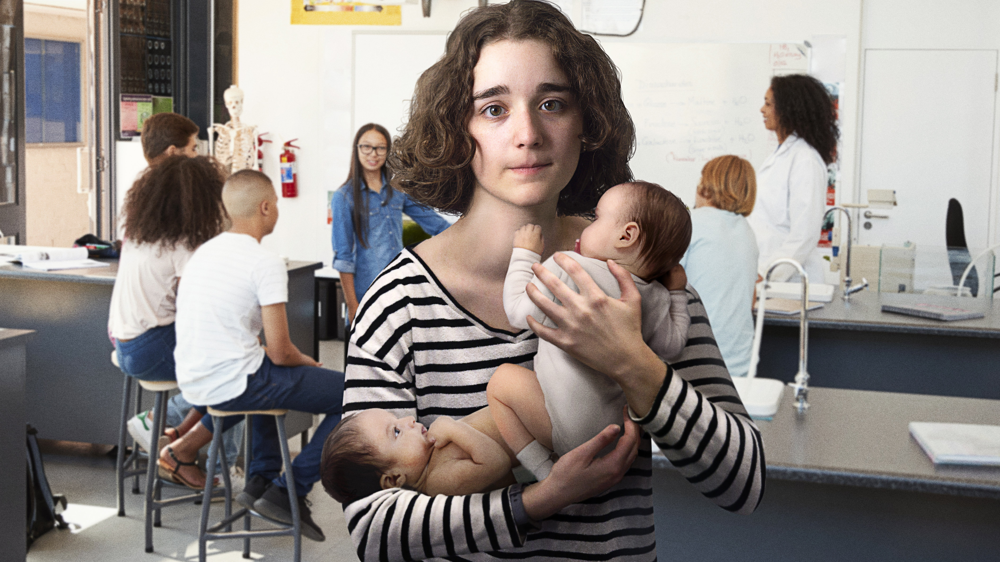

Downloaded and saved: images/satire/image_1534.jpg -> image_1534.jpg


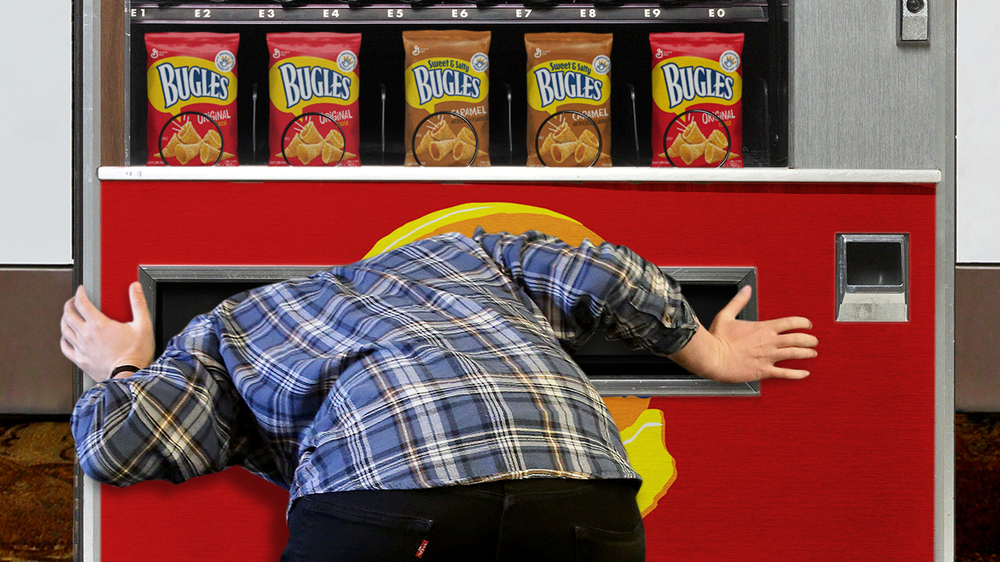

Downloaded and saved: images/satire/image_1941.jpg -> image_1941.jpg
Sample True Images:


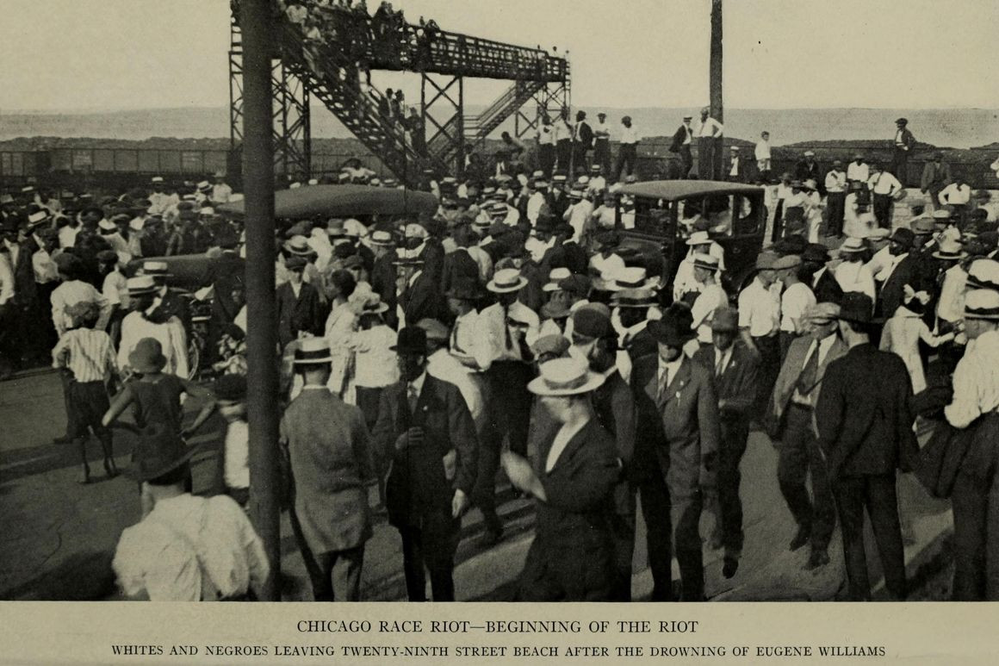

Downloaded and saved: images/true/image_5166.jpg -> image_5166.jpg


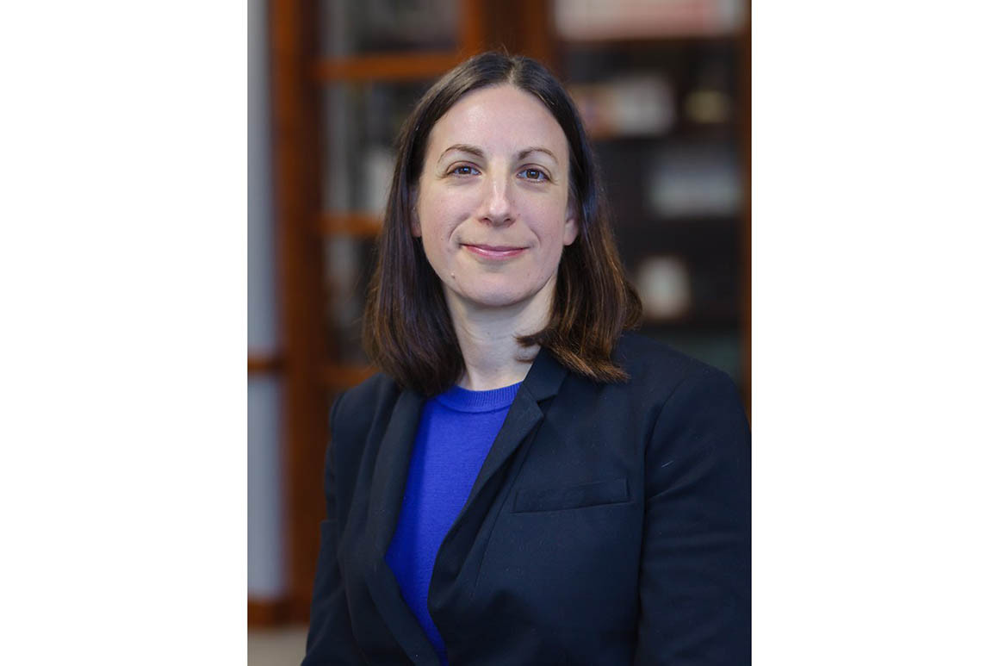

Downloaded and saved: images/true/image_5637.jpg -> image_5637.jpg


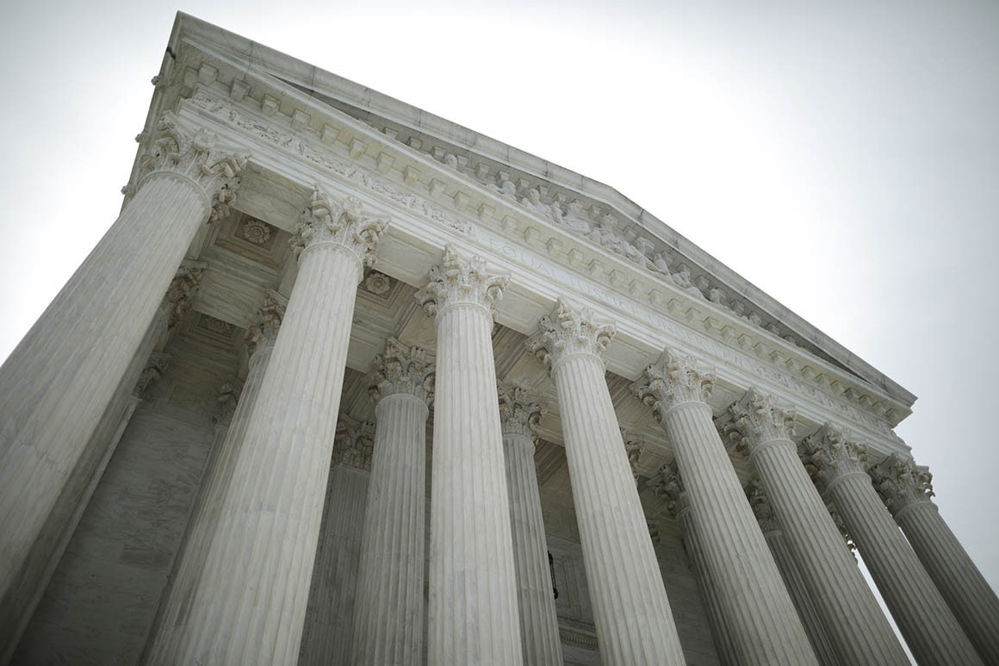

Downloaded and saved: images/true/image_5409.jpg -> image_5409.jpg


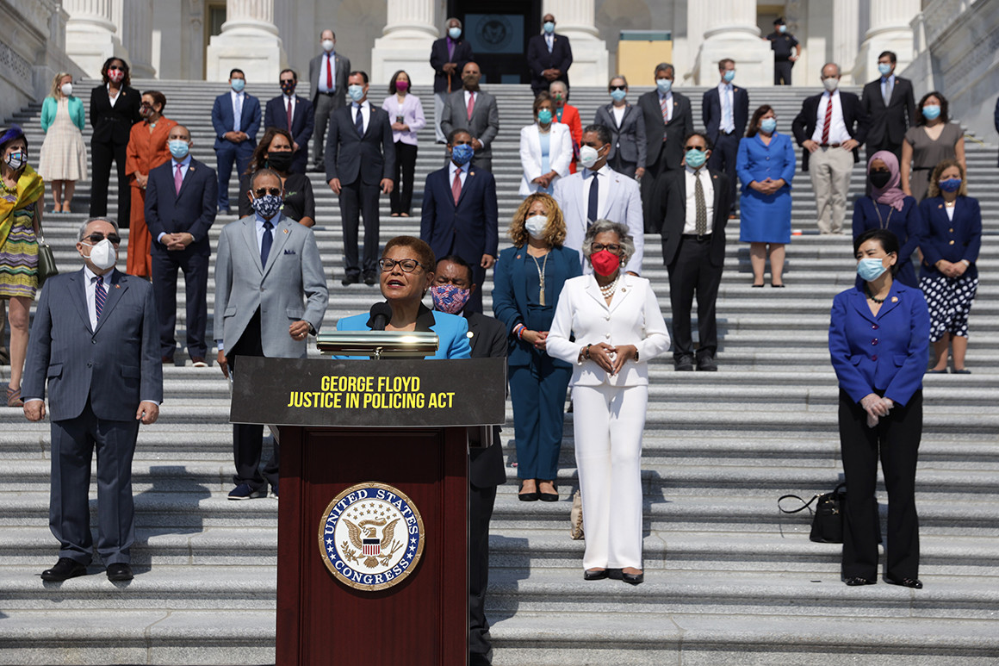

Downloaded and saved: images/true/image_5671.jpg -> image_5671.jpg


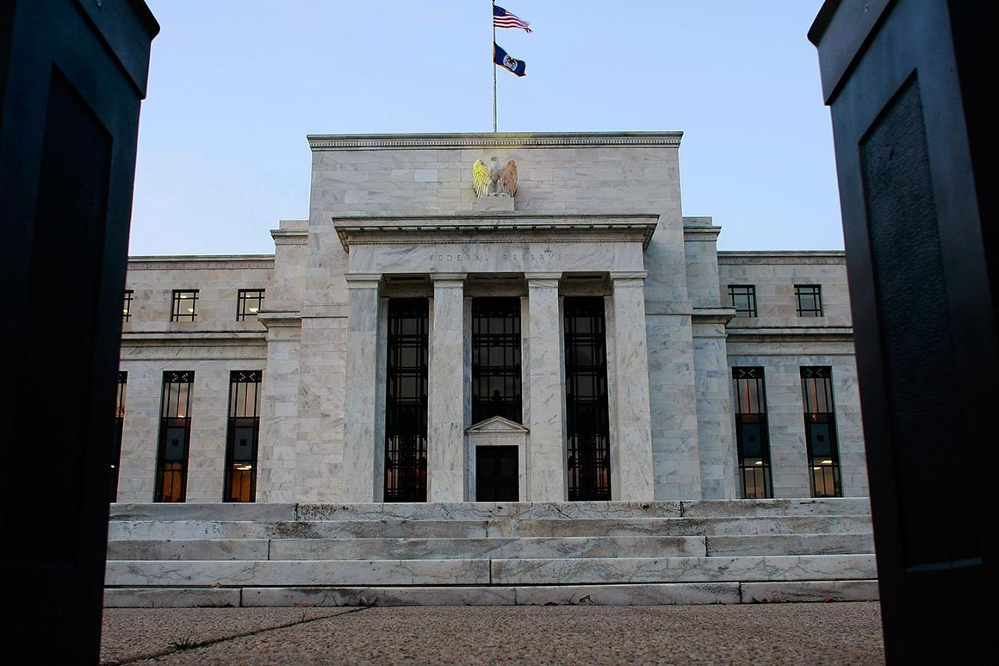

Downloaded and saved: images/true/image_5029.jpg -> image_5029.jpg


In [8]:
import boto3
from PIL import Image
import io
import random
import requests
from IPython.display import display, Image as IPImage


# Function to download and optionally display sample images
def download_and_display_sample_images(s3_bucket, s3_folder, num_samples=5, display_inline=False):
    # List objects in the specified S3 folder
    s3_objects = s3.list_objects_v2(Bucket=s3_bucket, Prefix=s3_folder)

    # Get a random sample of objects
    sample_objects = random.sample(s3_objects.get('Contents', []), num_samples)

    # Iterate through the sample objects, download, and optionally display the images
    for obj in sample_objects:
        s3_object_key = obj['Key']

        try:
            # Download the image from S3
            image_data = s3.get_object(Bucket=s3_bucket, Key=s3_object_key)['Body'].read()

            # Display the image inline if specified
            if display_inline:
                img = IPImage(data=image_data, format='png')
                display(img)

            # Save the image to a local file
            local_file_name = s3_object_key.split('/')[-1]
            with open('images/'+local_file_name, 'wb') as local_file:
                local_file.write(image_data)

            print(f"Downloaded and saved: {s3_object_key} -> {local_file_name}")
        except Exception as e:
            print(f"Error downloading image from S3: {str(e)}")

# Download and optionally display sample satire images inline
print("Sample Satire Images:")
download_and_display_sample_images(s3_bucket, s3_satire_folder, display_inline=True)

# Download and optionally display sample true images inline
print("Sample True Images:")
download_and_display_sample_images(s3_bucket, s3_true_folder, display_inline=True)

In [9]:
import boto3
import random
import requests
from PIL import Image
import io
import numpy as np
import matplotlib.pyplot as plt

# Initialize S3 client
s3 = boto3.client('s3')

# Function to load a subset of images from S3
def load_images_from_s3(s3_bucket, s3_folder, max_images=1400):
    # List objects in the specified S3 folder
    s3_objects = s3.list_objects_v2(Bucket=s3_bucket, Prefix=s3_folder)

    # Initialize a list to store images
    images = []

    # Randomly select a subset of objects
    all_objects = s3_objects.get('Contents', [])
    selected_objects = random.sample(all_objects, min(max_images, len(all_objects)))

    # Iterate through the selected objects and load images
    for obj in selected_objects:
        s3_object_key = obj['Key']

        try:
            # Generate a pre-signed URL for the S3 object
            image_url = s3.generate_presigned_url('get_object', Params={'Bucket': s3_bucket, 'Key': s3_object_key})

            # Send an HTTP GET request to the image URL
            response = requests.get(image_url)

            # Check if the request was successful (status code 200)
            if response.status_code == 200:
                # Open the image using Pillow and convert it to a NumPy array
                img = Image.open(io.BytesIO(response.content))
                img = np.array(img)
                images.append(img)
            else:
                print(f"Failed to download: {image_url} (Status Code: {response.status_code})")
        except Exception as e:
            print(f"Error processing image {s3_object_key}: {str(e)}")

    return images

# Load a subset of satire and true images from S3
satire_images = load_images_from_s3(s3_bucket, s3_satire_folder, max_images=700)
true_images = load_images_from_s3(s3_bucket, s3_true_folder, max_images=700)


Error processing image images/satire/image_1052.jpg: cannot identify image file <_io.BytesIO object at 0x7f55b75721d0>
Error processing image images/satire/image_1029.jpg: cannot identify image file <_io.BytesIO object at 0x7f55da761400>
Error processing image images/satire/image_1494.jpg: cannot identify image file <_io.BytesIO object at 0x7f55b73219f0>
Error processing image images/satire/image_1660.jpg: cannot identify image file <_io.BytesIO object at 0x7f55da761400>
Error processing image images/true/image_5829.jpg: cannot identify image file <_io.BytesIO object at 0x7f55da7bd720>
Error processing image images/true/image_5103.jpg: cannot identify image file <_io.BytesIO object at 0x7f55daba8db0>
Error processing image images/true/image_5372.jpg: cannot identify image file <_io.BytesIO object at 0x7f55da923f40>
Error processing image images/true/image_5337.jpg: cannot identify image file <_io.BytesIO object at 0x7f55daba8db0>
Error processing image images/true/image_5521.jpg: canno

In [10]:
def preprocess_images(images, target_size=(128, 128)):
    """
    Resize, ensure RGB format, and normalize a list of images.
    
    Parameters:
    - images: A list of images.
    - target_size: The target size for resizing.
    
    Returns:
    - A list of preprocessed images.
    """
    preprocessed = []
    for idx, img in enumerate(images):
        try:
            # Ensure the image is in RGB format
            img_rgb = Image.fromarray(img).convert('RGB')
            
            resized = np.array(img_rgb.resize(target_size))
            normalized = resized / 255.0
            
            # Check the shape before appending
            if normalized.shape == (128, 128, 3):
                preprocessed.append(normalized)
            else:
                print(f"Skipping image {idx} due to unexpected shape: {normalized.shape}")
        except Exception as e:
            print(f"Error processing image {idx}: {str(e)}")
            continue
    return np.array(preprocessed)

satire_images_processed = preprocess_images(satire_images)
true_images_processed = preprocess_images(true_images)



In [11]:
# Create labels for the images
satire_labels = [1] * len(satire_images_processed)
true_labels = [0] * len(true_images_processed)

# Concatenate the labels to form 'y'
y = np.concatenate((satire_labels, true_labels), axis=0)


In [12]:
# Flatten the images
satire_images_flattened = [img.ravel() for img in satire_images_processed]
true_images_flattened = [img.ravel() for img in true_images_processed]

X_flattened = np.concatenate((satire_images_flattened, true_images_flattened), axis=0)


In [13]:

from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Split the data
X_train, X_val, y_train, y_val = train_test_split(X_flattened, y, test_size=0.2, random_state=42)

# Create and train the SVM classifier
clf = SVC(kernel='linear')
clf.fit(X_train, y_train)

# Predict on the validation set
y_pred = clf.predict(X_val)

# Calculate accuracy
accuracy = accuracy_score(y_val, y_pred)
print(f"Validation Accuracy: {accuracy * 100:.2f}%")


Validation Accuracy: 68.36%


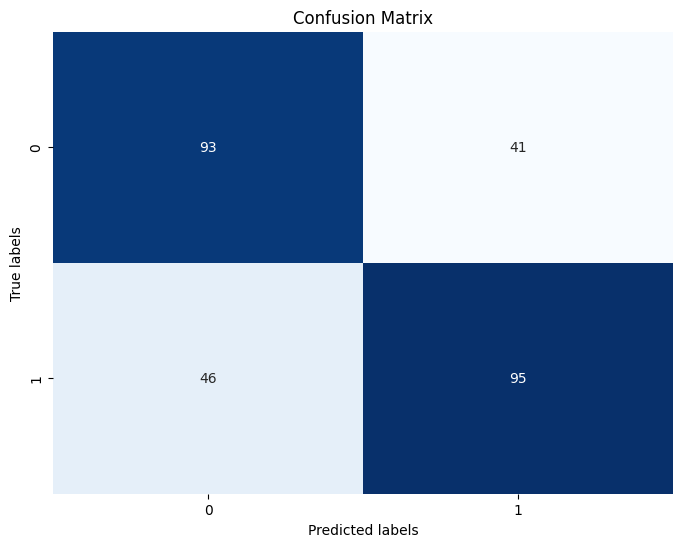

In [14]:

from sklearn.metrics import confusion_matrix
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(y_val, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


In [15]:
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(y_val, y_pred, target_names=['True', 'Satire'])
print(report)


              precision    recall  f1-score   support

        True       0.67      0.69      0.68       134
      Satire       0.70      0.67      0.69       141

    accuracy                           0.68       275
   macro avg       0.68      0.68      0.68       275
weighted avg       0.68      0.68      0.68       275



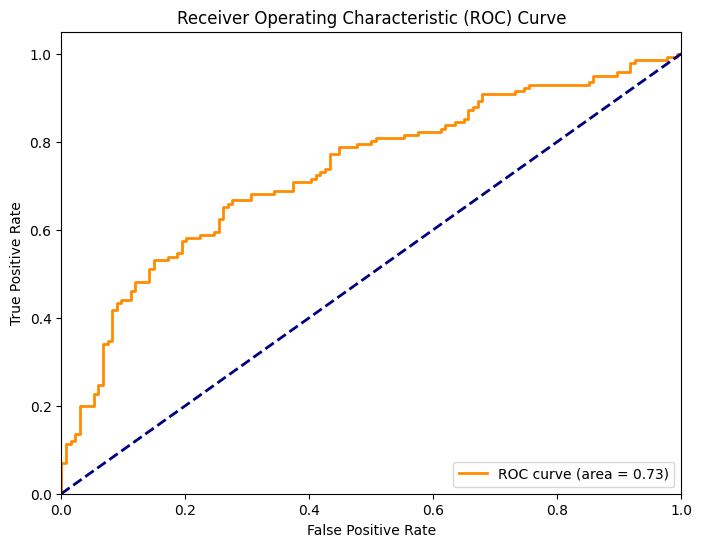

In [16]:
from sklearn.metrics import roc_curve, roc_auc_score, auc

# Get predicted probabilities
y_score = clf.decision_function(X_val)

# Compute ROC curve and AUC
fpr, tpr, _ = roc_curve(y_val, y_score)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
